In [1]:
!pip install --upgrade ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 904.4/904.4 kB 27.5 MB/s eta 0:00:00


In [2]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.9 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


In [3]:
from roboflow import Roboflow
rf = Roboflow(api_key="NWvTlLN20iba07SQBSSR")
project = rf.workspace("perso-drfaq").project("dog-breed-e2c2i")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Dog-Breed-1 in yolov8:: 100%|██████████| 4260/4260 [00:00<00:00, 6666.12it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
from ultralytics import YOLO

In [5]:
# Load a COCO-pretrained YOLOv8n model
model = YOLO("yolov8n.pt")

# Display model information (optional)
model.info()

# Train the model on the COCO8 example dataset for 100 epoch s
results = model.train(data="/content/Dog-Breed-1/data.yaml", epochs=10, imgsz=640)

100%|██████████| 6.25M/6.25M [00:00<00:00, 118MB/s]


YOLOv8n summary: 225 layers, 3,157,200 parameters, 0 gradients, 8.9 GFLOPs
Ultralytics 8.3.56 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Dog-Breed-1/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False

100%|██████████| 755k/755k [00:00<00:00, 22.5MB/s]


Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 105MB/s]


AMP: checks passed ✅


train: Scanning /content/Dog-Breed-1/train/labels... 1488 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1488/1488 [00:01<00:00, 1186.60it/s]

train: New cache created: /content/Dog-Breed-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.24 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/Dog-Breed-1/valid/labels... 425 images, 0 backgrounds, 0 corrupt: 100%|██████████| 425/425 [00:00<00:00, 967.57it/s] 

val: New cache created: /content/Dog-Breed-1/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000625, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.22G     0.7954      4.085      1.517         17        640: 100%|██████████| 93/93 [00:11<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.16it/s]


                   all        425        446     0.0873      0.301      0.105     0.0707

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10       2.1G     0.7944      3.418      1.515         23        640: 100%|██████████| 93/93 [00:08<00:00, 10.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.70it/s]

                   all        425        446      0.147       0.38      0.212      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10       2.1G     0.8039      3.035       1.52         16        640: 100%|██████████| 93/93 [00:08<00:00, 10.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.98it/s]

                   all        425        446      0.249      0.523      0.319      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10       2.1G     0.7873       2.71      1.491         16        640: 100%|██████████| 93/93 [00:09<00:00, 10.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.17it/s]

                   all        425        446      0.305      0.549      0.392      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.09G     0.7476      2.425      1.452         16        640: 100%|██████████| 93/93 [00:09<00:00, 10.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.04it/s]

                   all        425        446      0.481      0.523      0.498      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.09G      0.706      2.198      1.399         19        640: 100%|██████████| 93/93 [00:08<00:00, 10.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.87it/s]

                   all        425        446      0.489      0.633      0.564      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.09G      0.669      2.033      1.373         16        640: 100%|██████████| 93/93 [00:09<00:00, 10.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.00it/s]

                   all        425        446      0.579      0.606      0.598      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.09G     0.6037      1.812      1.304         16        640: 100%|██████████| 93/93 [00:09<00:00, 10.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.32it/s]


                   all        425        446      0.553      0.638      0.644      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.09G     0.5789      1.679      1.274         16        640: 100%|██████████| 93/93 [00:09<00:00, 10.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.14it/s]


                   all        425        446      0.566      0.671      0.669      0.525

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.09G     0.5387      1.535       1.23         17        640: 100%|██████████| 93/93 [00:08<00:00, 10.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.23it/s]


                   all        425        446      0.699      0.663      0.737      0.586

10 epochs completed in 0.035 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.56 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Model summary (fused): 168 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.26it/s]


                   all        425        446      0.694      0.661      0.737      0.586
      Blenheim_spaniel         37         38      0.669      0.684      0.794      0.613
             Chihuahua         25         25      0.596       0.72      0.711      0.529
        French_bulldog         33         33      0.697      0.727      0.806      0.638
      Japanese_spaniel         40         45      0.836      0.453       0.66       0.48
    Labrador_retriever         34         38      0.842      0.789      0.842       0.71
           Maltese_dog         47         49      0.793      0.781      0.798      0.617
              Pekinese         31         32      0.554      0.344      0.496      0.394
     Shetland_sheepdog         28         31      0.516      0.584      0.642      0.507
              Shih-Tzu         45         47      0.565      0.552      0.596      0.428
      golden_retriever         30         31       0.77      0.806      0.883       0.75
              papillo

In [6]:
from google.colab import files
import os
from PIL import Image
import matplotlib.pyplot as plt

In [17]:
def detectFromImage():
    # Upload file
    uploaded = files.upload()

    # Assuming a single file is uploaded, get the file name
    source_image = list(uploaded.keys())[0]

    # Verify the file path
    print(f"Source image: {source_image}")

    # Load the uploaded image
    image = Image.open(source_image)

    # Display the uploaded image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')  # Hide axis
    plt.show()

    # Load your trained YOLO model (replace with correct model path if needed)
    trained_model = YOLO("/content/runs/detect/train/weights/best.pt")
    trained_model.info()

    # Perform inference on the uploaded image
    model_results = trained_model.predict(source=source_image, conf=0.5, iou=0.5)
    print(model_results)
    model_result = model_results[0]

    # Display results (image with detected labels)
    model_result.show()

     # Extract predicted classes and display them
    class_names = model_result.names  # List of class names
    pred_classes = model_result.boxes.cls  # Predicted class indices
    pred_conf = model_result.boxes.conf  # Prediction confidence scores

    # Print predicted class names and confidence scores
    for idx, conf in zip(pred_classes, pred_conf):
        print(f"Predicted Class: {class_names[int(idx)]}, Confidence: {conf:.2f}")

    # Optionally save and display the prediction result
    result_image_path = "/content/predictions/prediction_result.jpg"

    # Save the image with labels (the plot method is now called with the correct parameters)
    model_result.save(filename=result_image_path)

    # Show the saved prediction result image
    result_image = Image.open(result_image_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(result_image)
    plt.axis('off')
    plt.show()

Saving R (1).jpeg to R (1) (3).jpeg
Source image: R (1) (3).jpeg


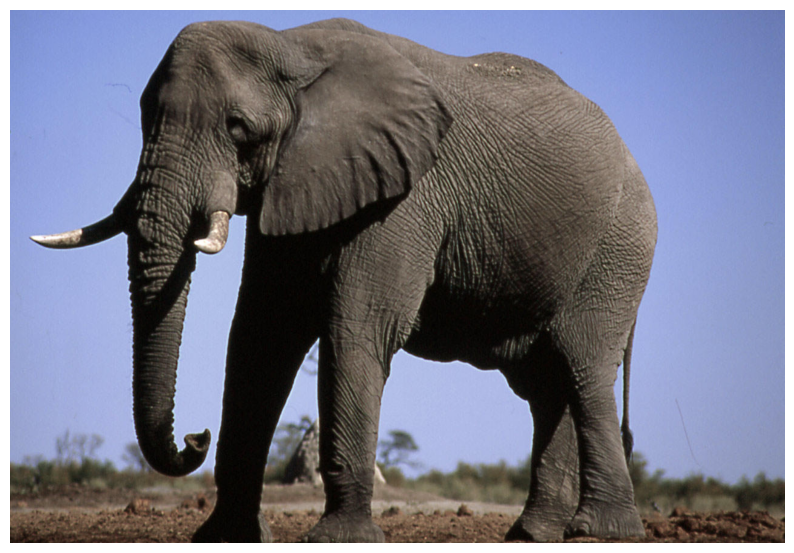

Model summary: 225 layers, 3,013,188 parameters, 0 gradients, 8.2 GFLOPs

image 1/1 /content/R (1) (3).jpeg: 448x640 (no detections), 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 448, 640)
[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'Blenheim_spaniel', 1: 'Chihuahua', 2: 'French_bulldog', 3: 'Japanese_spaniel', 4: 'Labrador_retriever', 5: 'Maltese_dog', 6: 'Pekinese', 7: 'Shetland_sheepdog', 8: 'Shih-Tzu', 9: 'golden_retriever', 10: 'papillon', 11: 'soft-coated_wheaten_terrier'}
obb: None
orig_img: array([[[201, 139, 121],
        [200, 138, 120],
        [200, 139, 119],
        ...,
        [177, 121, 104],
        [175, 121, 104],
        [174, 120, 103]],

       [[203, 139, 121],
        [203, 139, 121],
        [202, 139, 119],
        ...,
        [177, 121, 104],
        [175, 121, 104],
        [174, 120, 103]],

       [[203, 13

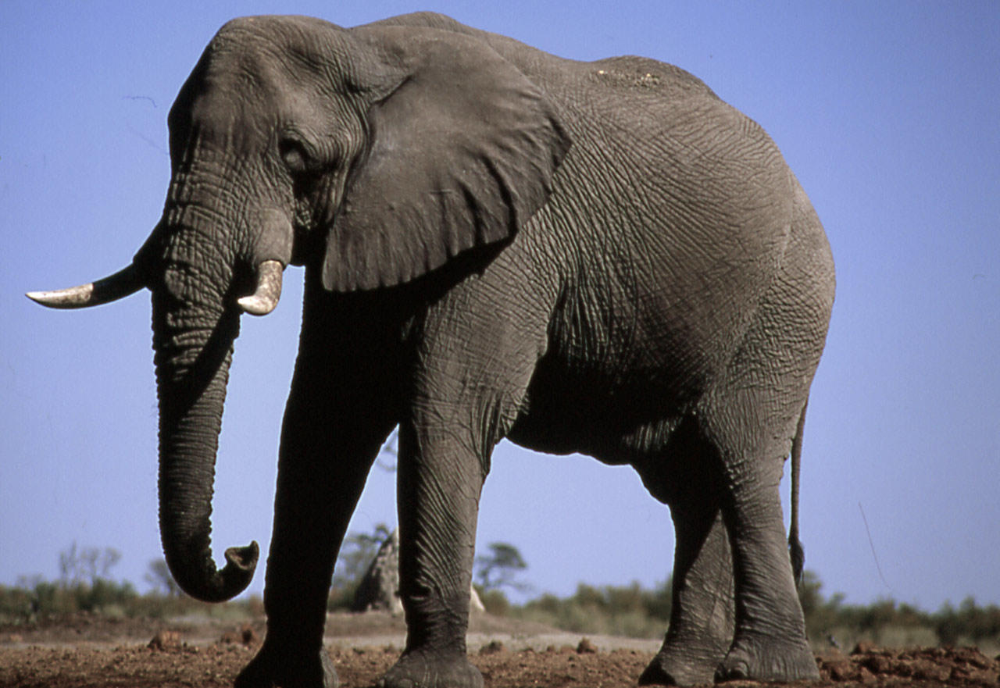

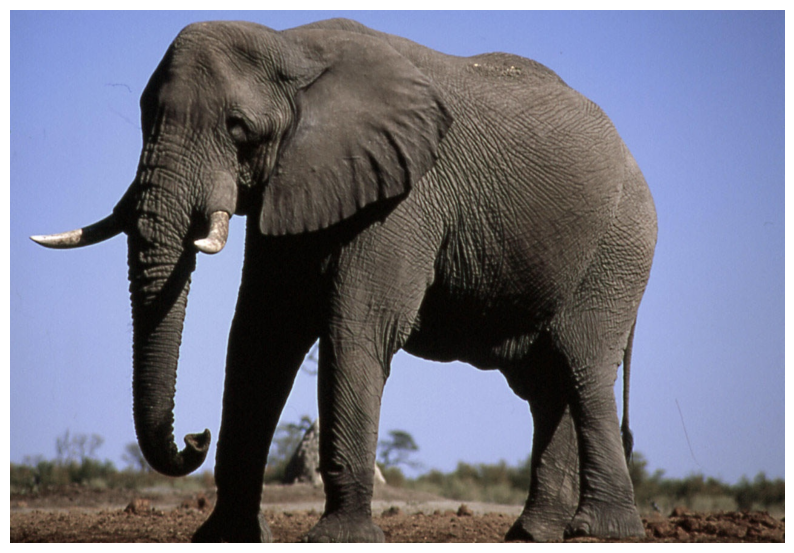

In [18]:
detectFromImage()

Saving n02085936_851_jpg.rf.ae956f8d37092bd6d8bc2bcba440f839.jpg to n02085936_851_jpg.rf.ae956f8d37092bd6d8bc2bcba440f839.jpg
Source image: n02085936_851_jpg.rf.ae956f8d37092bd6d8bc2bcba440f839.jpg


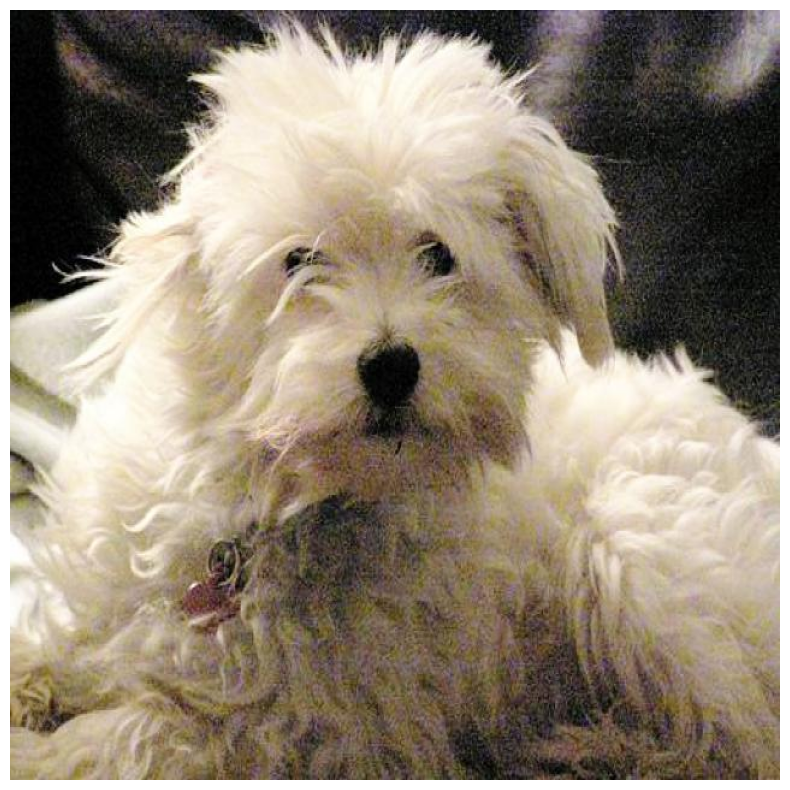

Model summary: 225 layers, 3,013,188 parameters, 0 gradients, 8.2 GFLOPs

image 1/1 /content/n02085936_851_jpg.rf.ae956f8d37092bd6d8bc2bcba440f839.jpg: 640x640 1 Maltese_dog, 8.2ms
Speed: 1.7ms preprocess, 8.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'Blenheim_spaniel', 1: 'Chihuahua', 2: 'French_bulldog', 3: 'Japanese_spaniel', 4: 'Labrador_retriever', 5: 'Maltese_dog', 6: 'Pekinese', 7: 'Shetland_sheepdog', 8: 'Shih-Tzu', 9: 'golden_retriever', 10: 'papillon', 11: 'soft-coated_wheaten_terrier'}
obb: None
orig_img: array([[[  8,   9,   7],
        [  4,   5,   3],
        [  2,   3,   1],
        ...,
        [160, 150, 162],
        [171, 157, 169],
        [182, 168, 180]],

       [[ 10,  11,   9],
        [  7,   8,   6],
        [  5,   6,   4],
        ...,
        [166, 154, 166],
        [173, 159, 171],
  

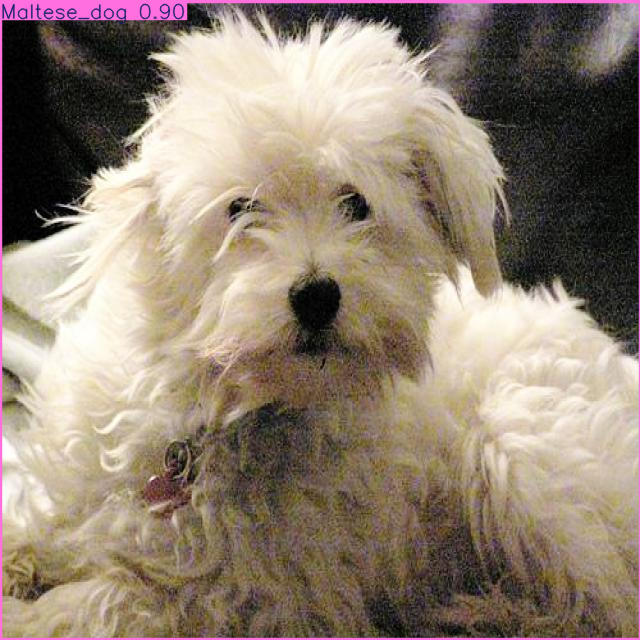

Predicted Class: Maltese_dog, Confidence: 0.90


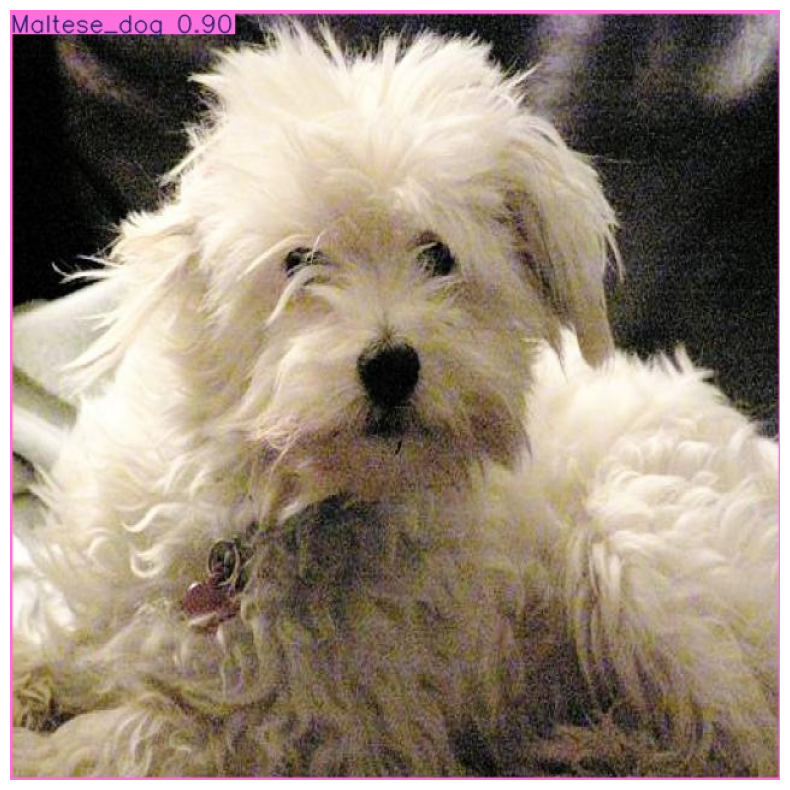

In [11]:
detectFromImage()

Saving n02085620_3651_jpg.rf.040df58f3600ccaf5fe8f0eea15b0231.jpg to n02085620_3651_jpg.rf.040df58f3600ccaf5fe8f0eea15b0231.jpg
Source image: n02085620_3651_jpg.rf.040df58f3600ccaf5fe8f0eea15b0231.jpg


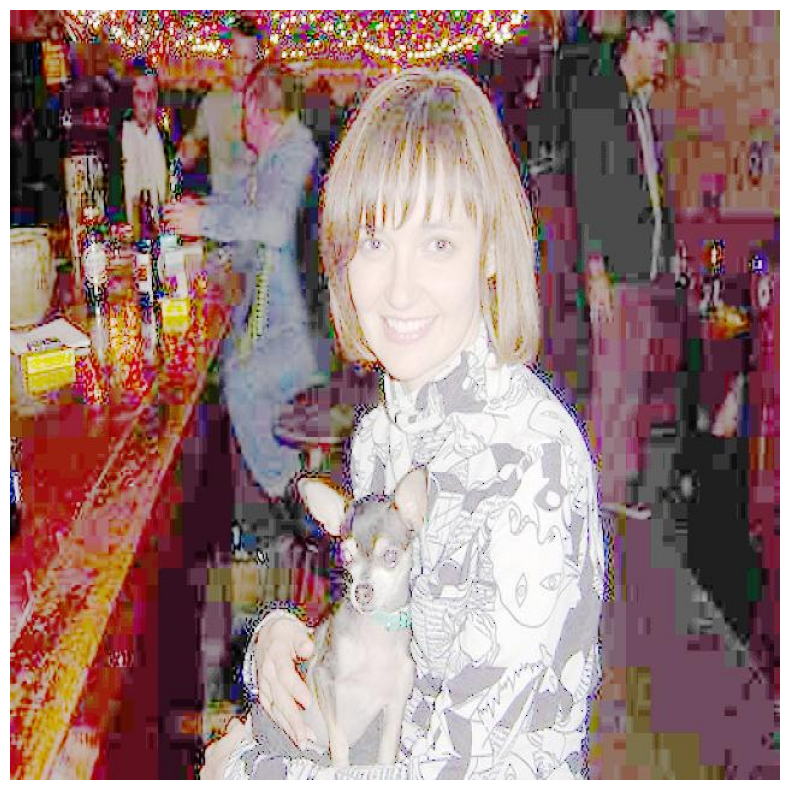

Model summary: 225 layers, 3,013,188 parameters, 0 gradients, 8.2 GFLOPs

image 1/1 /content/n02085620_3651_jpg.rf.040df58f3600ccaf5fe8f0eea15b0231.jpg: 640x640 1 Maltese_dog, 7.8ms
Speed: 1.6ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'Blenheim_spaniel', 1: 'Chihuahua', 2: 'French_bulldog', 3: 'Japanese_spaniel', 4: 'Labrador_retriever', 5: 'Maltese_dog', 6: 'Pekinese', 7: 'Shetland_sheepdog', 8: 'Shih-Tzu', 9: 'golden_retriever', 10: 'papillon', 11: 'soft-coated_wheaten_terrier'}
obb: None
orig_img: array([[[ 64,  49, 171],
        [ 47,  30, 151],
        [ 49,  30, 151],
        ...,
        [ 77, 110, 126],
        [ 70, 111, 126],
        [ 50,  98, 110]],

       [[ 64,  49, 170],
        [ 47,  31, 149],
        [ 50,  30, 149],
        ...,
        [ 77, 110, 126],
        [ 70, 111, 126],
 

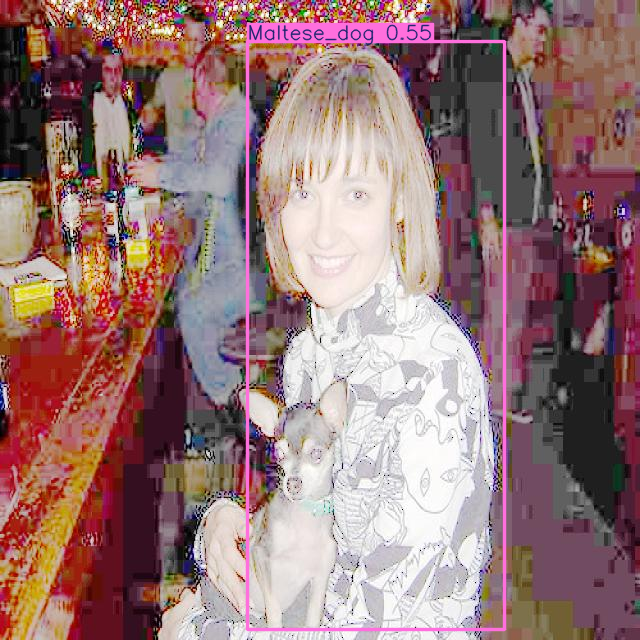

Predicted Class: Maltese_dog, Confidence: 0.55


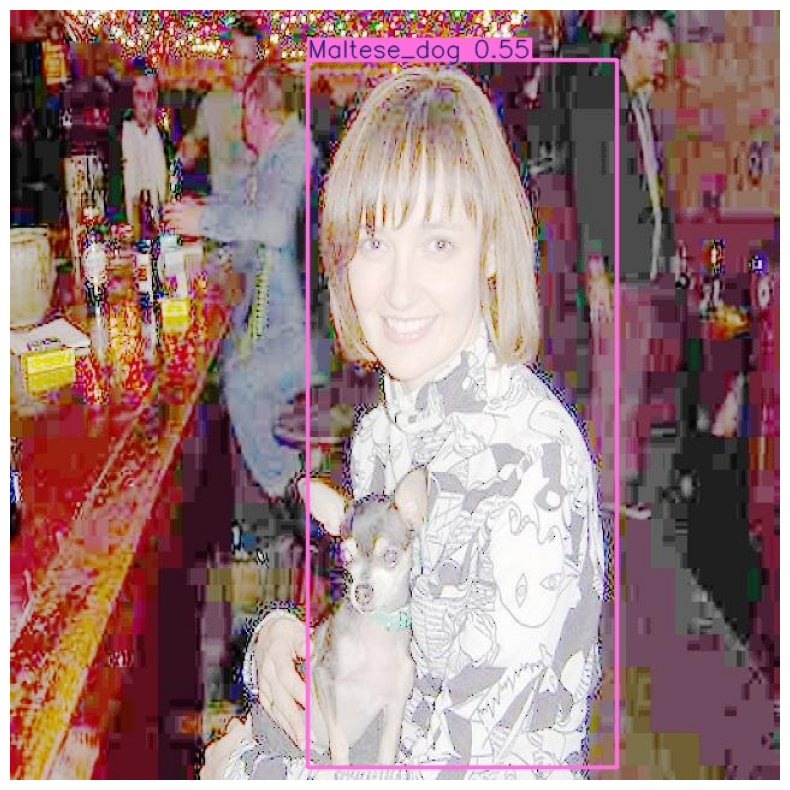

In [12]:
detectFromImage()

Saving n02085620_3742_jpg.rf.bc7fe6efbef4ddfd2861a77046e15cbf.jpg to n02085620_3742_jpg.rf.bc7fe6efbef4ddfd2861a77046e15cbf.jpg
Source image: n02085620_3742_jpg.rf.bc7fe6efbef4ddfd2861a77046e15cbf.jpg


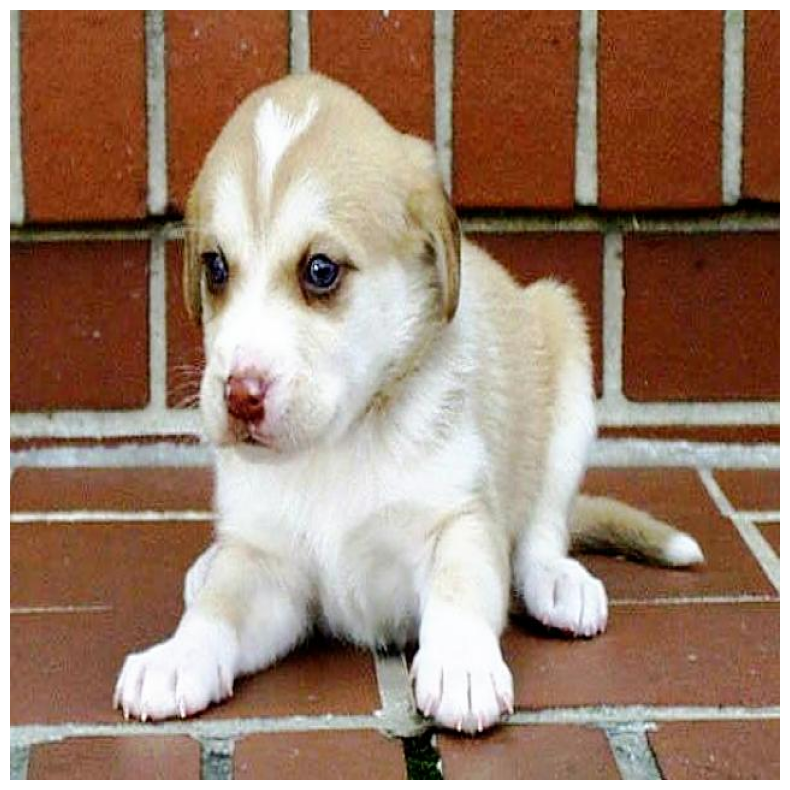

Model summary: 225 layers, 3,013,188 parameters, 0 gradients, 8.2 GFLOPs

image 1/1 /content/n02085620_3742_jpg.rf.bc7fe6efbef4ddfd2861a77046e15cbf.jpg: 640x640 1 Chihuahua, 9.4ms
Speed: 2.0ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'Blenheim_spaniel', 1: 'Chihuahua', 2: 'French_bulldog', 3: 'Japanese_spaniel', 4: 'Labrador_retriever', 5: 'Maltese_dog', 6: 'Pekinese', 7: 'Shetland_sheepdog', 8: 'Shih-Tzu', 9: 'golden_retriever', 10: 'papillon', 11: 'soft-coated_wheaten_terrier'}
obb: None
orig_img: array([[[159, 171, 171],
        [160, 173, 171],
        [156, 170, 164],
        ...,
        [ 25,  56, 117],
        [ 29,  59, 118],
        [ 35,  65, 124]],

       [[158, 170, 170],
        [159, 172, 170],
        [155, 169, 163],
        ...,
        [ 27,  58, 119],
        [ 31,  60, 121],
   

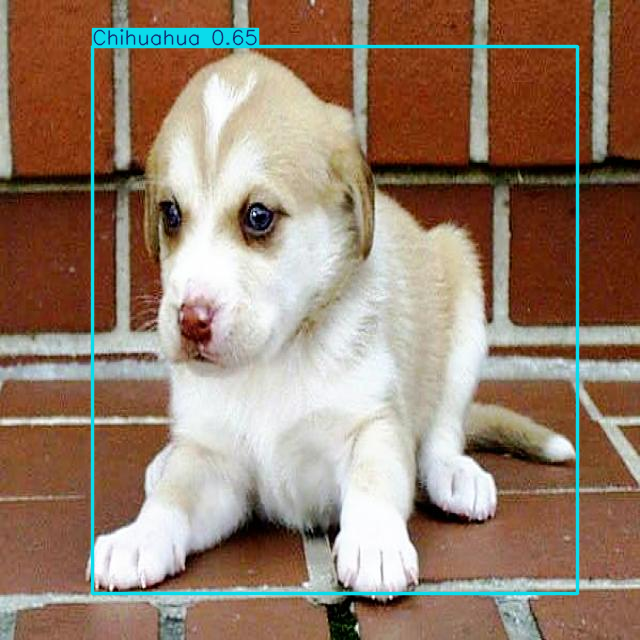

Predicted Class: Chihuahua, Confidence: 0.65


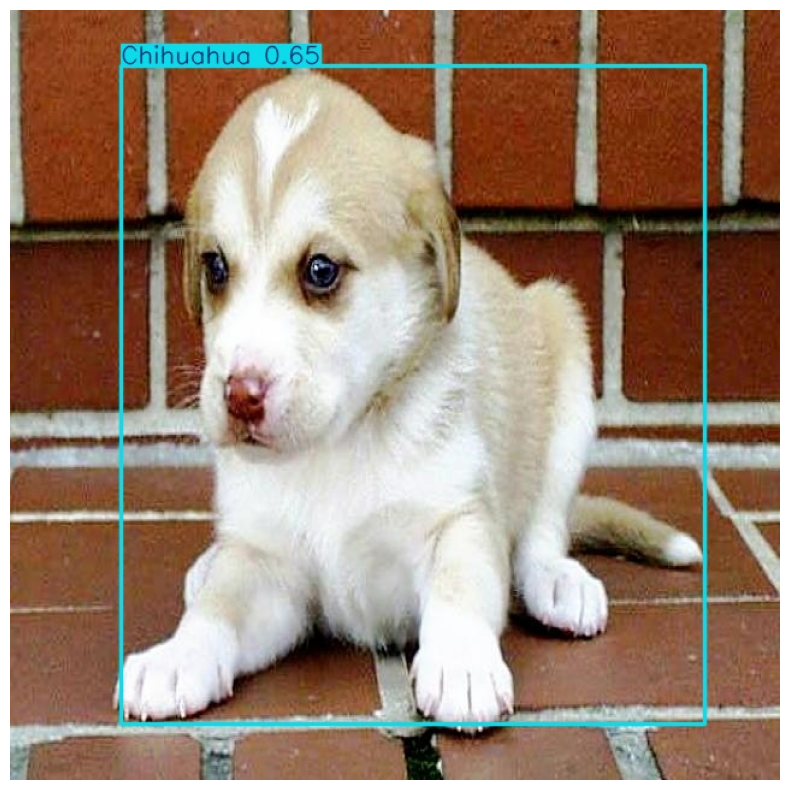

In [13]:
detectFromImage()

Saving n02085620_9654_jpg.rf.b685ef989d2baf895b7954aa147443bf.jpg to n02085620_9654_jpg.rf.b685ef989d2baf895b7954aa147443bf.jpg
Source image: n02085620_9654_jpg.rf.b685ef989d2baf895b7954aa147443bf.jpg


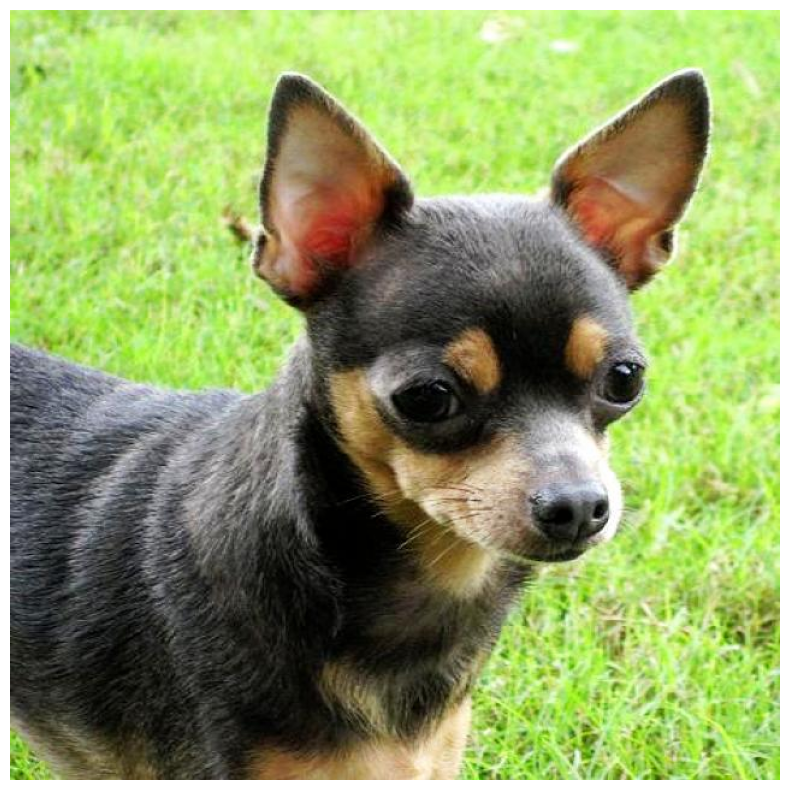

Model summary: 225 layers, 3,013,188 parameters, 0 gradients, 8.2 GFLOPs

image 1/1 /content/n02085620_9654_jpg.rf.b685ef989d2baf895b7954aa147443bf.jpg: 640x640 1 Chihuahua, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'Blenheim_spaniel', 1: 'Chihuahua', 2: 'French_bulldog', 3: 'Japanese_spaniel', 4: 'Labrador_retriever', 5: 'Maltese_dog', 6: 'Pekinese', 7: 'Shetland_sheepdog', 8: 'Shih-Tzu', 9: 'golden_retriever', 10: 'papillon', 11: 'soft-coated_wheaten_terrier'}
obb: None
orig_img: array([[[116, 240, 194],
        [116, 238, 192],
        [116, 236, 188],
        ...,
        [116, 248, 195],
        [116, 247, 196],
        [118, 252, 200]],

       [[109, 234, 188],
        [107, 232, 186],
        [109, 231, 183],
        ...,
        [119, 249, 196],
        [117, 248, 197],
   

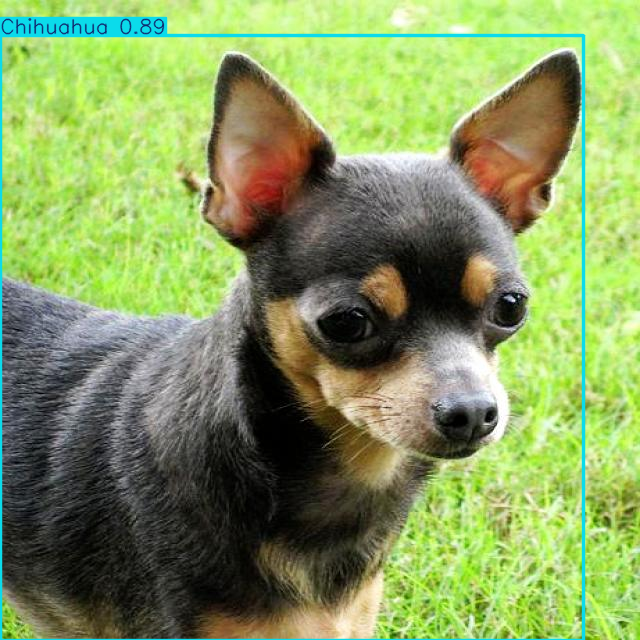

Predicted Class: Chihuahua, Confidence: 0.89


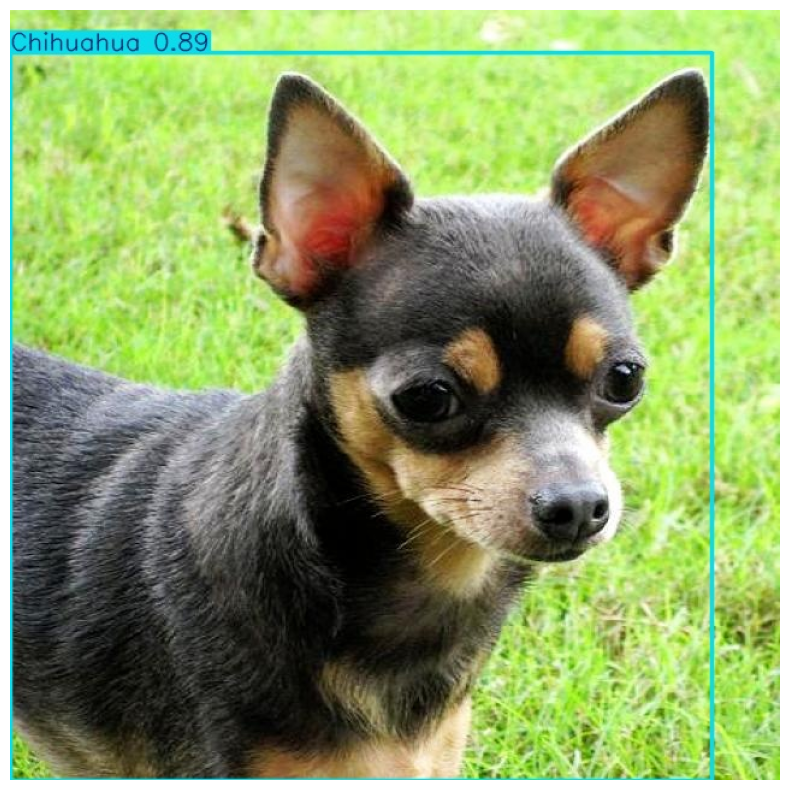

In [14]:
detectFromImage()

In [19]:
# prompt: write code for download project files as zip

import shutil

def zip_project_files(output_filename="project_files.zip"):
    """Zips the project files into a specified output file.

    Args:
        output_filename (str, optional): The name of the output zip file. Defaults to "project_files.zip".
    """
    try:
        shutil.make_archive(output_filename.replace(".zip", ""), 'zip', "/content/runs")  # Zip the /content directory
        print(f"Successfully created {output_filename}")
    except Exception as e:
        print(f"Error creating zip file: {e}")


# Example usage: Create a zip file named 'my_project.zip'
zip_project_files("my_project.zip")

# Download the zip file
from google.colab import files
files.download("my_project.zip")

Successfully created my_project.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>